In [1]:
#  Basic Libraries
import numpy as np  # numerical computations
import pandas as pd  # data manipulation

#  Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#  Machine Learning and Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

#  Deep Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG19
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten,
    Dropout, Dense, Input, BatchNormalization, AveragePooling2D
)

#  Image Processing
from PIL import Image
import os
import random


2025-05-15 14:35:21.203842: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747319721.396388      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747319721.449904      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_153.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_107.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_147.jpeg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_145.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_122.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_110.jpeg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_43.jpeg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_118.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_124.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/Zain_70.jpg
/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Zain/

In [3]:
#  Basic Libraries
import numpy as np  # numerical computations
import pandas as pd  # data manipulation

#  Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#  Machine Learning and Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

#  Deep Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG19
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten,
    Dropout, Dense, Input, BatchNormalization, AveragePooling2D
)

#  Image Processing
from PIL import Image
import os
import random


In [4]:
dataset_path = '/kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset'

In [5]:
def get_data(dataset_path):
    X = []
    y = []
    
    for dir in os.listdir(dataset_path):
        dir_path = os.path.join(dataset_path, dir)
        print(f"{dir} processed")
        
        # Skip if not a directory
        if not os.path.isdir(dir_path):
            continue
            
        for image_name in os.listdir(dir_path):
            image_path = os.path.join(dir_path, image_name)
            try:
                with Image.open(image_path) as img:
                    image_rgb = img.convert("RGB")
                    image_resized = image_rgb.resize((200, 200))
                    X.append(np.array(image_resized))
                    y.append(dir)
            except Exception as e:
                print(f"Error processing {image_path}: {e}")
    
    return np.array(X), np.array(y)

X, y = get_data(dataset_path)

Zain processed
Zah processed
Meem processed
Seen processed
Teh processed
Lam processed
Dad processed
Teh_Marbuta processed
Reh processed
Sad processed
Dal processed
Sheen processed
Hah processed
Beh processed
Tah processed
Alef processed
Waw processed
Qaf processed
Al processed
Ghain processed
Heh processed
Ain processed
Kaf processed
Thal processed
Feh processed
Khah processed
Yeh processed
Error processing /kaggle/input/rgb-arabic-alphabets-sign-language-dataset/RGB ArSL dataset/Yeh/Yeh_61.jpg: image file is truncated (7 bytes not processed)
Jeem processed
Theh processed
Noon processed
Laa processed


In [6]:
X.shape

(7855, 200, 200, 3)

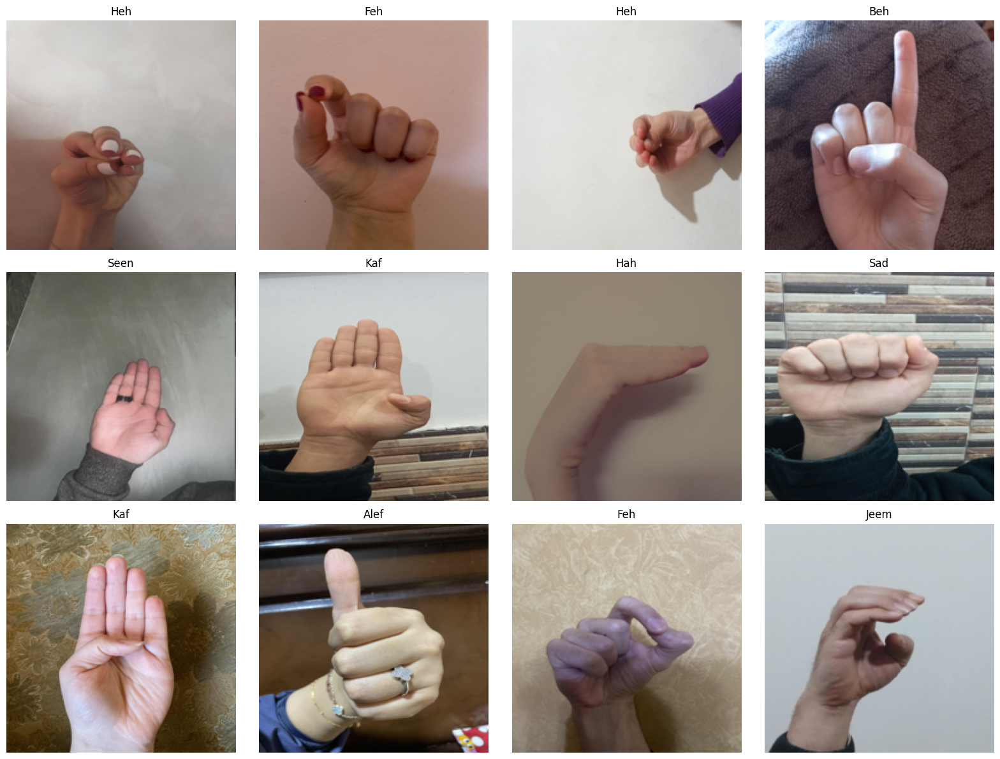

In [7]:
random_indices = random.sample(range(len(X)), 12)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))

axes = axes.flatten()

for i, idx in enumerate(random_indices):
    axes[i].imshow(X[idx])
    axes[i].set_title(y[idx])
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [8]:
np_X = np.array(X)
X_ = np_X.astype('float32')/255.0

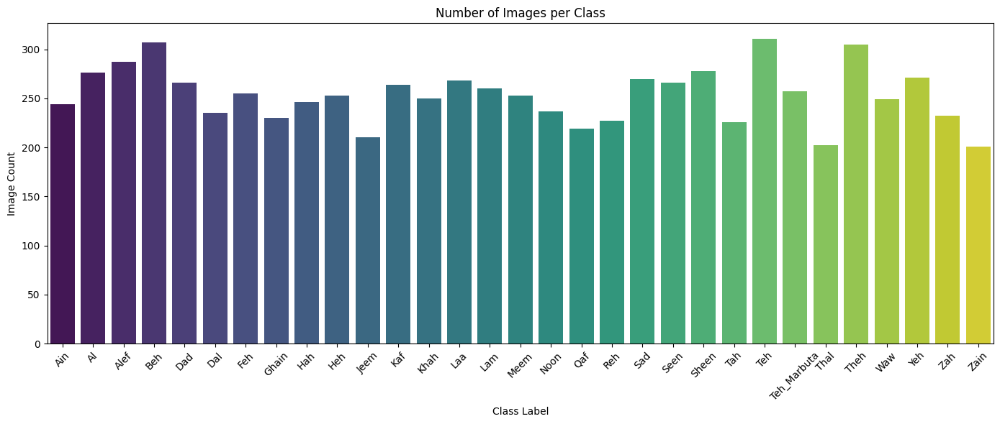

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Count labels
label_counts = pd.Series(y).value_counts().sort_index()

# Plot distribution
plt.figure(figsize=(14, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette="viridis")
plt.title("Number of Images per Class")
plt.xlabel("Class Label")
plt.ylabel("Image Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


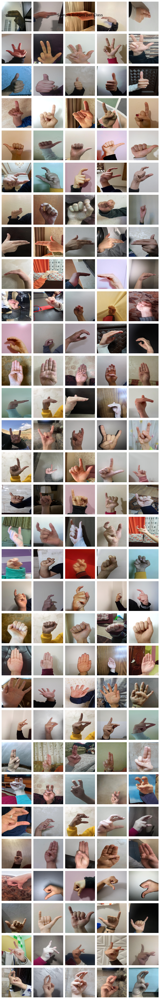

In [11]:
import matplotlib.pyplot as plt
import random

def plot_sample_images(X, y, samples_per_class=5):
    classes = sorted(set(y))
    plt.figure(figsize=(samples_per_class * 2, len(classes) * 2))

    for class_index, class_label in enumerate(classes):
        idxs = [i for i, label in enumerate(y) if label == class_label]
        selected_idxs = random.sample(idxs, samples_per_class)

        for i, idx in enumerate(selected_idxs):
            plt_idx = class_index * samples_per_class + i + 1
            plt.subplot(len(classes), samples_per_class, plt_idx)
            plt.imshow(X[idx])
            plt.axis("off")
            if i == 0:
                plt.ylabel(class_label, fontsize=12)

    plt.suptitle("Sample Images per Class", fontsize=16)
    plt.tight_layout()
    plt.show()

# Call the function
plot_sample_images(X, y)


In [12]:
le = LabelEncoder()
le.fit(y)
y_ = le.transform(y)

num_classes = len(set(y_))

print(f"number of classes: {num_classes}")

number of classes: 31


In [13]:
X_temp, X_test, y_temp, y_test = train_test_split(X_, y_, test_size=0.2, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp)

In [14]:
print(f"Training set: {X_train.shape[0]} samples")
print(f"Validation set: {X_val.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")

Training set: 5027 samples
Validation set: 1257 samples
Test set: 1571 samples


In [15]:
base_model = VGG19(weights='imagenet',include_top=False , input_shape=(200,200,3))

for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-4:]:
    layer.trainable = True

model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer=Adam(learning_rate=0.00001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

I0000 00:00:1747320865.977517      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 6, 6, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 31)                  │           7,967 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,426,335 (77.92 MB)

 Trainable params: 7,481,375 (28.54 MB)

 Non-trainable params: 12,944,960 (49.38 MB)

In [16]:
with tf.device('/GPU:0'):
  history = model.fit(
      X_train, y_train,
      validation_data=(X_val, y_val),
      batch_size=32,
      epochs=100
  )

Epoch 1/100


I0000 00:00:1747320877.342751      81 service.cc:148] XLA service 0x7b8f2c0120f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747320877.343505      81 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1747320877.840781      81 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/158 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - accuracy: 0.0234 - loss: 3.6002

I0000 00:00:1747320886.274241      81 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


158/158 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - accuracy: 0.0320 - loss: 3.5562 - val_accuracy: 0.0700 - val_loss: 3.3597
Epoch 2/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.0585 - loss: 3.3549 - val_accuracy: 0.1933 - val_loss: 3.1040
Epoch 3/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.1440 - loss: 3.0898 - val_accuracy: 0.3007 - val_loss: 2.5879
Epoch 4/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.2316 - loss: 2.6897 - val_accuracy: 0.4018 - val_loss: 2.1314
Epoch 5/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.3188 - loss: 2.3273 - val_accuracy: 0.5179 - val_loss: 1.7918
Epoch 6/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.3953 - loss: 1.9734 - val_accuracy: 0.5823 - val_loss: 1.5240
Epoch 7/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.4630 - loss: 1.7221 - val_accuracy: 0.6396 - val_loss: 1.3110
Epoch 8/100
158/158 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - accuracy: 0.5180 - loss: 1.549

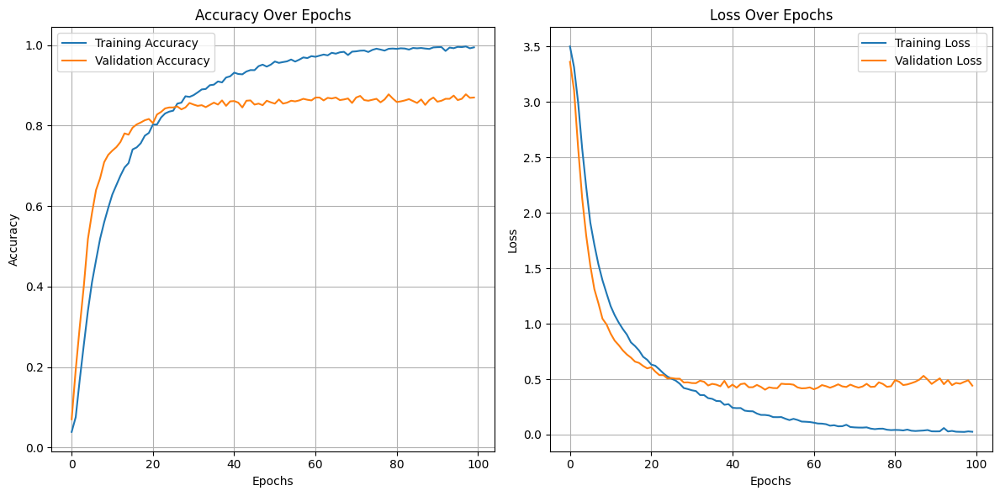

In [17]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [18]:
with tf.device('/GPU:0'):
  loss, accuracy = model.evaluate(X_test, y_test, batch_size=32)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy * 100:.2f}%")

50/50 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8793 - loss: 0.4500
Test Loss: 0.4778
Test Accuracy: 87.71%


In [19]:
with tf.device('/GPU:0'):
    y_pred = model.predict(X_test)
    y_pred_classes = y_pred.argmax(axis=1)

y_test_decoded = le.inverse_transform(y_test)
y_pred_classes_decoded = le.inverse_transform(y_pred_classes)

report_dict = classification_report(y_test_decoded, y_pred_classes_decoded, output_dict=True)

report_df = pd.DataFrame(report_dict).transpose()

report_df

50/50 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step


,precision,recall,f1-score,support
Ain,0.888889,0.979592,0.932039,49.000000
Al,0.946429,0.963636,0.954955,55.000000
Alef,0.948276,0.964912,0.956522,57.000000
Beh,0.820896,0.887097,0.852713,62.000000
Dad,0.910714,0.962264,0.935780,53.000000
Dal,0.666667,0.851064,0.747664,47.000000
Feh,0.853659,0.686275,0.760870,51.000000
Ghain,0.952381,0.869565,0.909091,46.000000
Hah,0.833333,0.816327,0.824742,49.000000
Heh,0.862745,0.862745,0.862745,51.000000


In [20]:
report_df.to_csv('arabic_sign_lang.csv')

<Figure size 800x600 with 0 Axes>

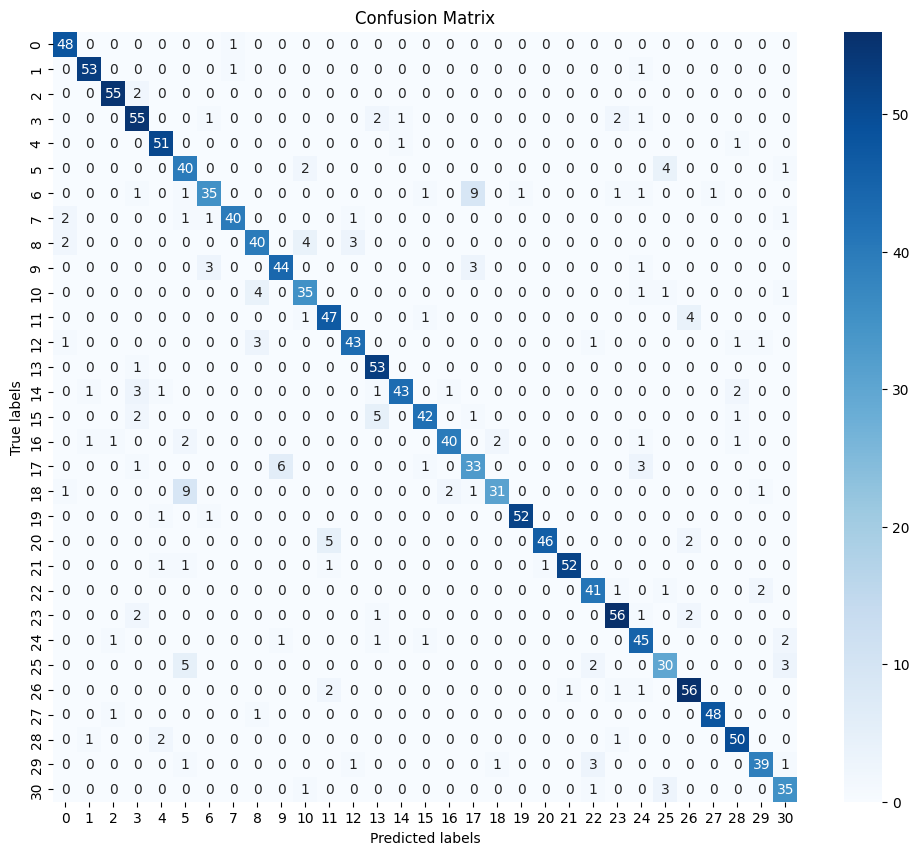

In [21]:
cm = confusion_matrix(y_test, y_pred_classes)

plt.figure(figsize=(8, 6))
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [22]:
model.save('arabic_sign_lang.keras')